<a href="https://colab.research.google.com/github/KheperX/ml_cactus/blob/main/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python

In [ ]:
import numpy as np
import cv2
from os import listdir
from os.path import isfile, join
from tqdm import tqdm
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten , Conv2D, MaxPool2D
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


(<Axes: >, <matplotlib.image.AxesImage at 0x7bd1c13c17b0>)

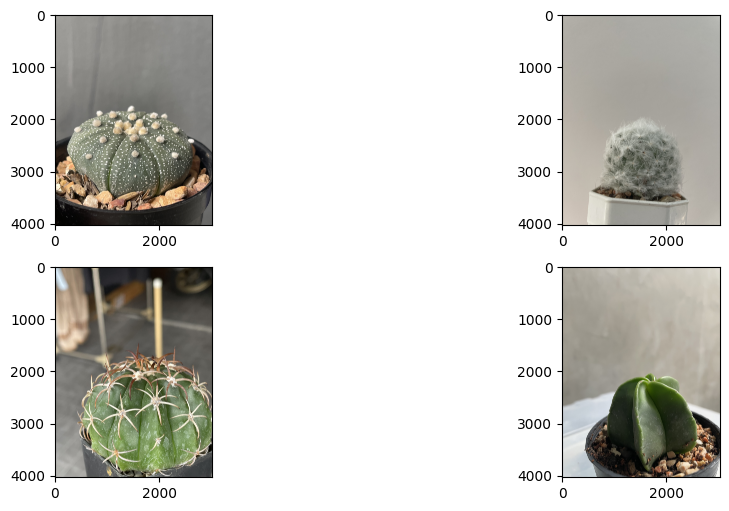

In [ ]:
img1 = cv2.imread('/content/drive/MyDrive/train/Astrophytum/IMG_9243.jpg')
img1 = cv2.cvtColor(img1 , cv2.COLOR_BGR2RGB)

img2 = cv2.imread('/content/drive/MyDrive/train/Mammillaria/IMG_5063.jpg')
img2 = cv2.cvtColor(img2 , cv2.COLOR_BGR2RGB)

img3 = cv2.imread('/content/drive/MyDrive/train/Melocactus/IMG_3085.jpg')
img3 = cv2.cvtColor(img3 , cv2.COLOR_BGR2RGB)

img4 = cv2.imread('/content/drive/MyDrive/train/cactus/IMG_3669.jpg')
img4 = cv2.cvtColor(img4 , cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12,6))
plt.subplot(221),plt.imshow(img1)
plt.subplot(222),plt.imshow(img2)
plt.subplot(223),plt.imshow(img3)
plt.subplot(224),plt.imshow(img4)

In [ ]:
width = 256
num_classes = 4
trainpath = 'drive/MyDrive/train/'
testpath = 'drive/MyDrive/test/'
trainImg = [trainpath+f for f in listdir(trainpath)]
testImg = [testpath+f for f in listdir(testpath)]

In [ ]:
def img2data(paths):
    rawImgs = []
    labels = []

    for i, path in enumerate(paths):
        for item in tqdm(listdir(path)):
            if item.endswith('.jpg'):
                file = join(path, item)
                img = cv2.imread(file)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, (width, width))
                rawImgs.append(img)

                label = [0] * len(paths)
                label[i] = 1
                labels.append(label)

    return rawImgs, labels

paths = [
    '/content/drive/MyDrive/train/Astrophytum',
    '/content/drive/MyDrive/train/Mammillaria',
    '/content/drive/MyDrive/train/Melocactus',
    '/content/drive/MyDrive/train/cactus'
]

x_train, y_train = img2data(paths)

test_paths = [
    '/content/drive/MyDrive/test/Astrophytum',
    '/content/drive/MyDrive/test/Mammillaria',
    '/content/drive/MyDrive/test/Melocactus',
    '/content/drive/MyDrive/test/cactus'
]

x_test, y_test = img2data(test_paths)


100%|██████████| 20/20 [00:20<00:00,  1.04s/it]


In [ ]:
trainImg , testImg

(['drive/MyDrive/train/Mammillaria',
  'drive/MyDrive/train/Melocactus',
  'drive/MyDrive/train/cactus',
  'drive/MyDrive/train/Astrophytum'],
 ['drive/MyDrive/test/Astrophytum',
  'drive/MyDrive/test/Mammillaria',
  'drive/MyDrive/test/Melocactus',
  'drive/MyDrive/test/cactus'])

In [ ]:
x_train, y_train = img2data(trainImg)
x_test, y_test = img2data(testImg)

100%|██████████| 20/20 [00:15<00:00,  1.33it/s]


In [ ]:
x_train = np.array(x_train)
y_train = np.array(y_train)
x_test = np.array(x_test)
y_test = np.array(y_test)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

In [ ]:
x_train.shape,y_train.shape,x_test.shape, y_test.shape

((324, 256, 256, 3), (324, 4), (80, 256, 256, 3), (80, 4))

In [ ]:
model = Sequential([
        Conv2D(128, (3,3), activation='relu', input_shape=(width, width, 3)),
        MaxPool2D(2),
        Conv2D(128,(3,3) , activation='relu'),
        MaxPool2D(pool_size=(2,2 )),
        Dense(16),
        Flatten(),

        Dense(num_classes, activation='softmax')
    ])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 128)     0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 128)       0         
 g2D)                                                            
                                                                 
 dense (Dense)               (None, 62, 62, 16)        2064      
                                                                 
 flatten (Flatten)           (None, 61504)             0

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics= ['accuracy'])
batch_size = 32
epochs = 3

In [ ]:
history = model.fit(x_train, y_train ,batch_size=batch_size, epochs=epochs ,validation_data=(x_test, y_test))

Epoch 1/3
11/11 [==============================] - 193s 17s/step - loss: 2.6318 - accuracy: 0.2685 - val_loss: 1.4649 - val_accuracy: 0.3250
Epoch 2/3
11/11 [==============================] - 163s 15s/step - loss: 0.9455 - accuracy: 0.6667 - val_loss: 0.4928 - val_accuracy: 0.7750
Epoch 3/3
11/11 [==============================] - 171s 16s/step - loss: 0.2351 - accuracy: 0.9414 - val_loss: 0.1231 - val_accuracy: 0.9125


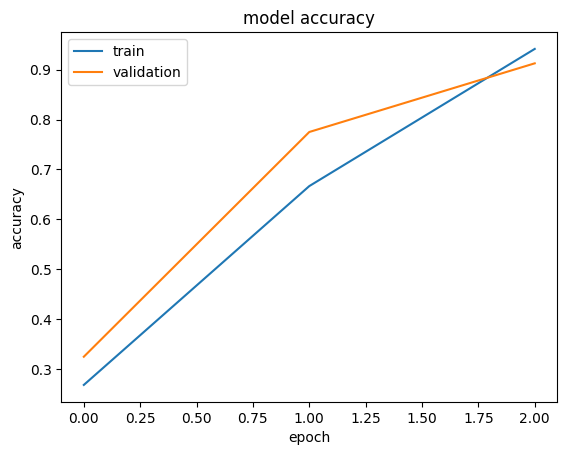

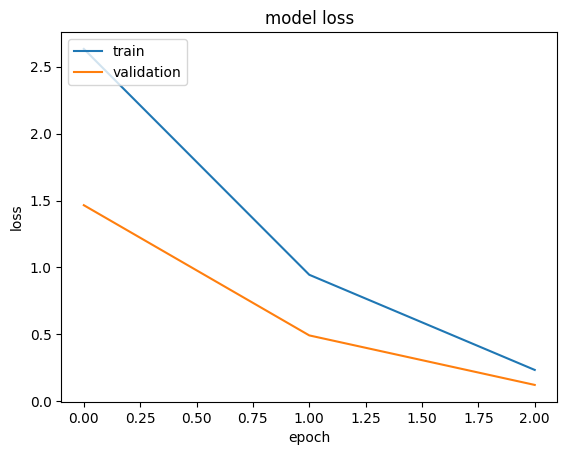

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

1/1 [==============================] - 0s 428ms/step
[[0.9939428  0.00134083 0.00209053 0.00262591]]
real: IMG_9223.jpg
predict: Astrophytum


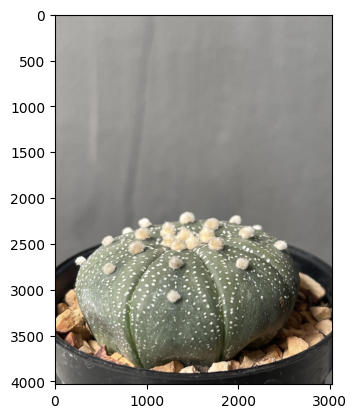

1/1 [==============================] - 0s 129ms/step
[[9.9928135e-01 2.4820760e-05 2.7356358e-04 4.2043897e-04]]
real: IMG_9224.jpg
predict: Astrophytum


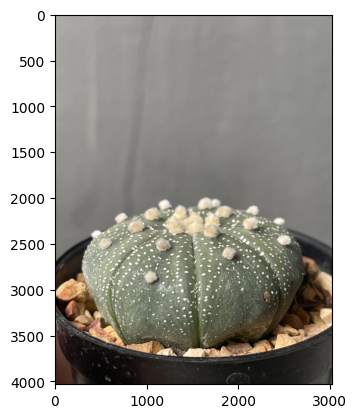

1/1 [==============================] - 0s 118ms/step
[[9.9910480e-01 1.8410999e-05 3.0727845e-04 5.6945486e-04]]
real: IMG_9225.jpg
predict: Astrophytum


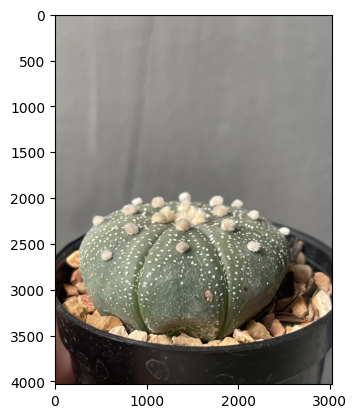

1/1 [==============================] - 0s 117ms/step
[[9.9855846e-01 9.4812976e-06 4.2436281e-04 1.0076573e-03]]
real: IMG_9226.jpg
predict: Astrophytum


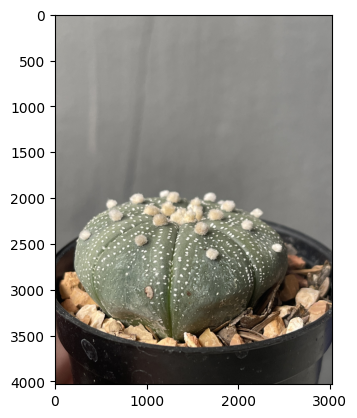

1/1 [==============================] - 0s 118ms/step
[[9.9514872e-01 1.1379958e-05 1.4988305e-03 3.3410802e-03]]
real: IMG_9227.jpg
predict: Astrophytum


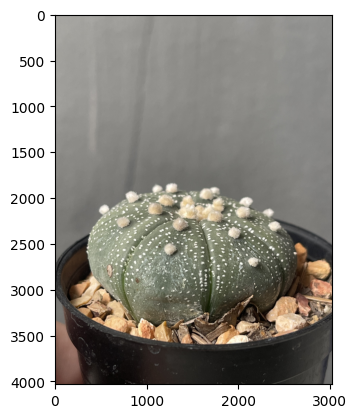

1/1 [==============================] - 0s 122ms/step
[[9.9947602e-01 2.8470704e-06 3.0166912e-04 2.1950139e-04]]
real: IMG_9228.jpg
predict: Astrophytum


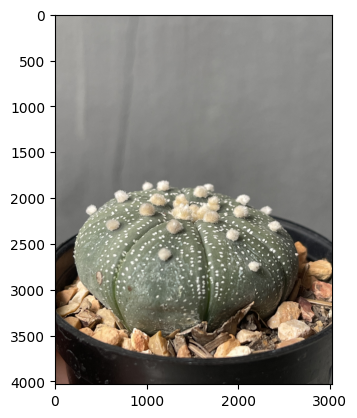

1/1 [==============================] - 0s 191ms/step
[[9.9693763e-01 2.9233988e-06 1.3936175e-03 1.6658703e-03]]
real: IMG_9229.jpg
predict: Astrophytum


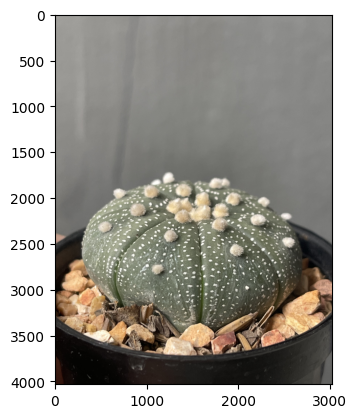

1/1 [==============================] - 0s 123ms/step
[[9.9834824e-01 1.4421595e-06 8.2947238e-04 8.2087115e-04]]
real: IMG_9230.jpg
predict: Astrophytum


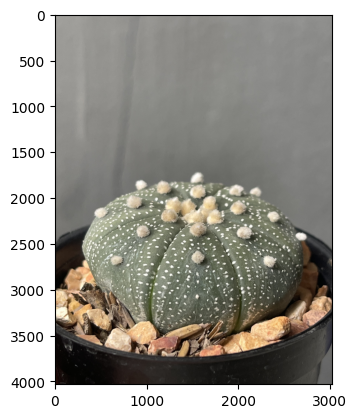

1/1 [==============================] - 0s 120ms/step
[[9.9874651e-01 1.8198474e-06 6.9637282e-04 5.5529957e-04]]
real: IMG_9231.jpg
predict: Astrophytum


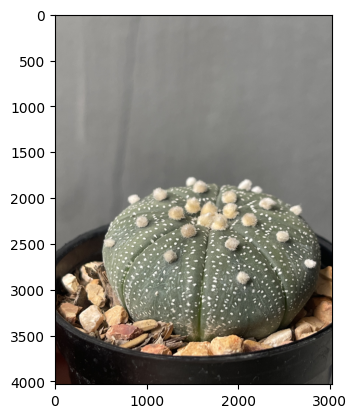

1/1 [==============================] - 0s 120ms/step
[[9.9884254e-01 2.9966827e-06 6.4784277e-04 5.0664897e-04]]
real: IMG_9232.jpg
predict: Astrophytum


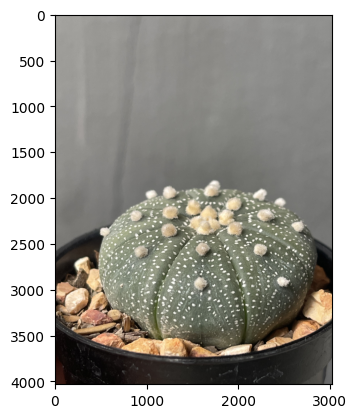

1/1 [==============================] - 0s 117ms/step
[[9.9853039e-01 8.5506408e-06 7.3380506e-04 7.2719413e-04]]
real: IMG_9233.jpg
predict: Astrophytum


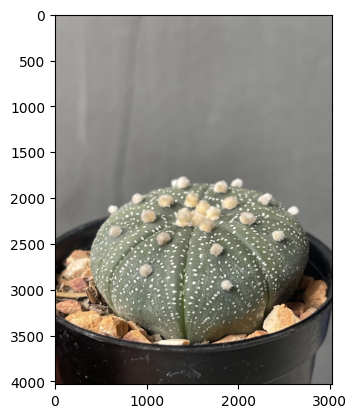

1/1 [==============================] - 0s 118ms/step
[[9.9933261e-01 4.8599622e-06 2.7729655e-04 3.8518166e-04]]
real: IMG_9234.jpg
predict: Astrophytum


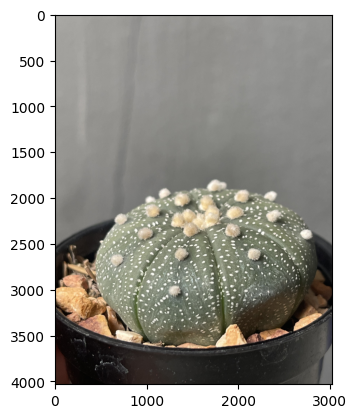

1/1 [==============================] - 0s 212ms/step
[[9.9757141e-01 7.7535791e-05 1.0617070e-03 1.2893113e-03]]
real: IMG_9235.jpg
predict: Astrophytum


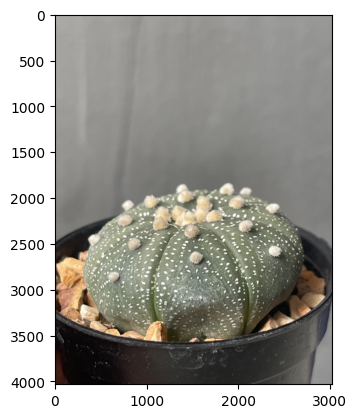

1/1 [==============================] - 0s 174ms/step
[[9.9854773e-01 1.0155298e-04 6.3199020e-04 7.1878941e-04]]
real: IMG_9236.jpg
predict: Astrophytum


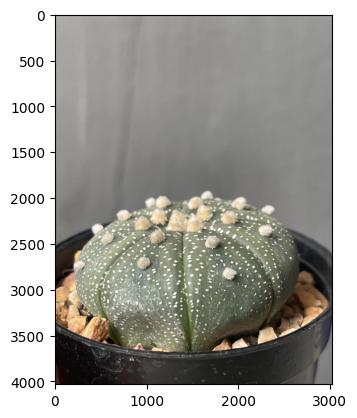

1/1 [==============================] - 0s 121ms/step
[[9.9903214e-01 3.3729793e-05 3.7486470e-04 5.5925857e-04]]
real: IMG_9237.jpg
predict: Astrophytum


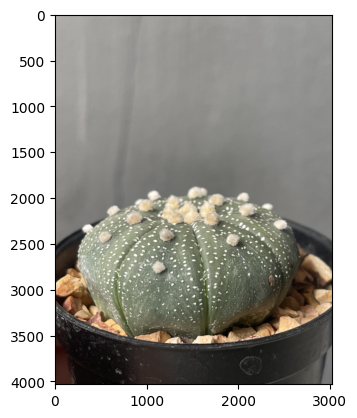

1/1 [==============================] - 0s 117ms/step
[[9.9889946e-01 1.8225361e-05 4.1517237e-04 6.6706142e-04]]
real: IMG_9238.jpg
predict: Astrophytum


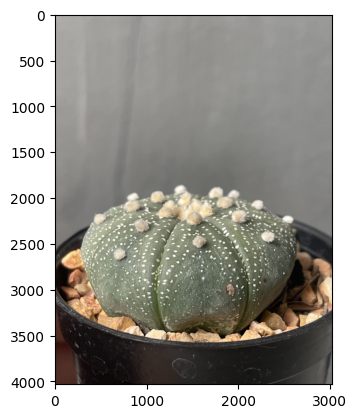

1/1 [==============================] - 0s 132ms/step
[[9.9916971e-01 4.2592319e-06 2.6022238e-04 5.6575588e-04]]
real: IMG_9239.jpg
predict: Astrophytum


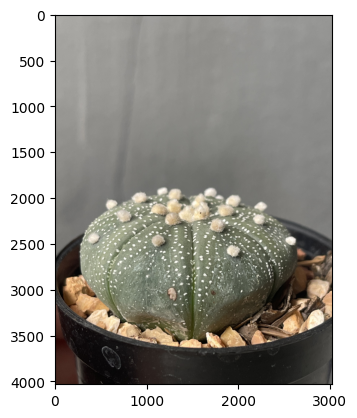

1/1 [==============================] - 0s 128ms/step
[[9.9905854e-01 3.7415898e-06 4.1394067e-04 5.2376132e-04]]
real: IMG_9240.jpg
predict: Astrophytum


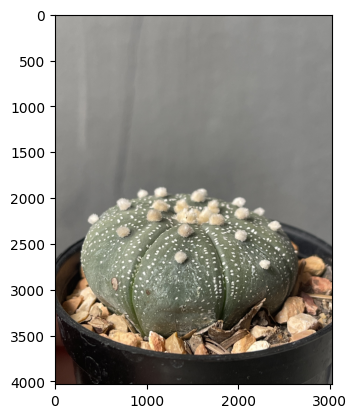

1/1 [==============================] - 0s 177ms/step
[[9.9836498e-01 3.7395521e-06 5.9805426e-04 1.0333298e-03]]
real: IMG_9241.jpg
predict: Astrophytum


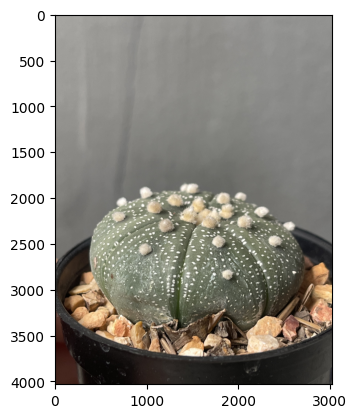

1/1 [==============================] - 0s 218ms/step
[[9.9737549e-01 2.3217110e-06 1.2343174e-03 1.3879174e-03]]
real: IMG_9242.jpg
predict: Astrophytum


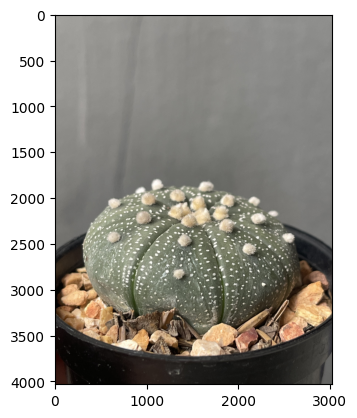

1/1 [==============================] - 0s 121ms/step
[[2.5290379e-03 9.9637282e-01 1.7757183e-04 9.2061446e-04]]
real: IMG_4923.jpg
predict: Mammillaria


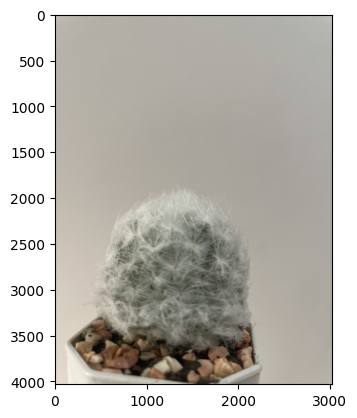

1/1 [==============================] - 0s 132ms/step
[[2.1963017e-03 9.9708444e-01 1.2491197e-04 5.9429591e-04]]
real: IMG_4924.jpg
predict: Mammillaria


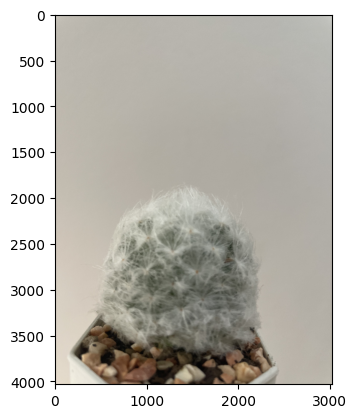

1/1 [==============================] - 0s 117ms/step
[[1.1156988e-03 9.9794191e-01 8.6023858e-05 8.5647148e-04]]
real: IMG_4928.jpg
predict: Mammillaria


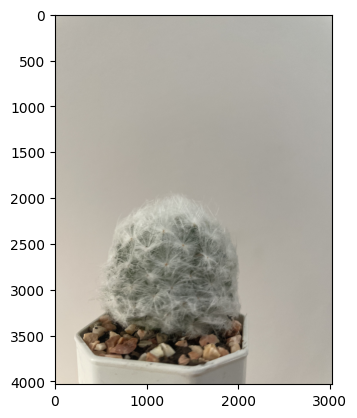

1/1 [==============================] - 0s 116ms/step
[[4.2169765e-04 9.9910504e-01 1.0539868e-04 3.6777422e-04]]
real: IMG_4976.jpg
predict: Mammillaria


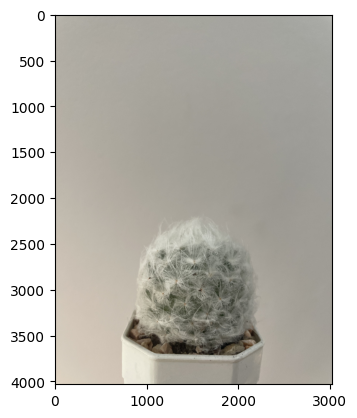

1/1 [==============================] - 0s 117ms/step
[[9.8527235e-04 9.9789339e-01 9.4625888e-05 1.0267176e-03]]
real: IMG_5007.jpg
predict: Mammillaria


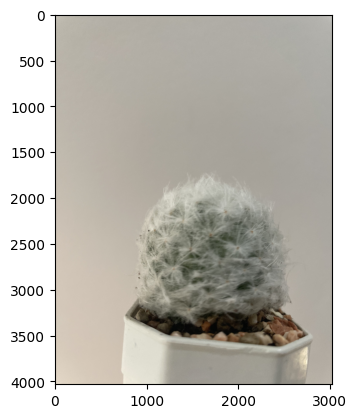

1/1 [==============================] - 0s 207ms/step
[[5.0409726e-04 9.9850583e-01 1.5110237e-04 8.3900744e-04]]
real: IMG_5008.jpg
predict: Mammillaria


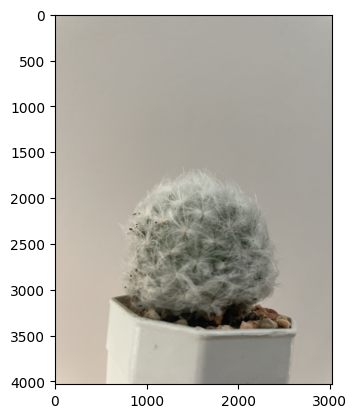

1/1 [==============================] - 0s 128ms/step
[[2.9650333e-04 9.9897158e-01 8.0723614e-05 6.5115036e-04]]
real: IMG_5009.jpg
predict: Mammillaria


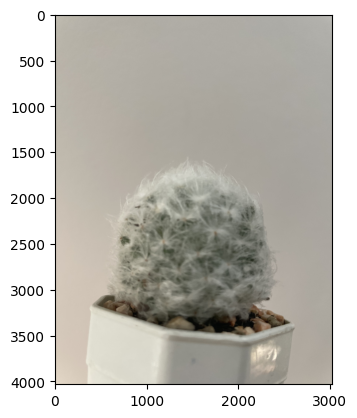

1/1 [==============================] - 0s 118ms/step
[[2.2378509e-04 9.9907517e-01 6.7246125e-05 6.3378114e-04]]
real: IMG_5010.jpg
predict: Mammillaria


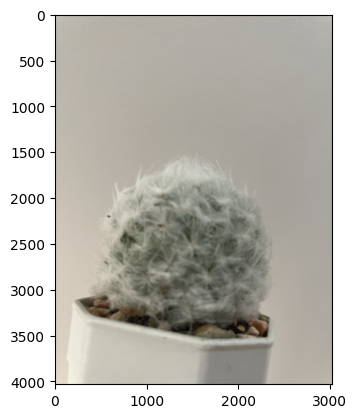

1/1 [==============================] - 0s 116ms/step
[[2.7252437e-04 9.9872309e-01 8.0800419e-05 9.2351233e-04]]
real: IMG_5011.jpg
predict: Mammillaria


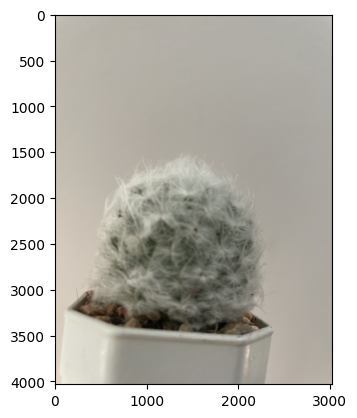

1/1 [==============================] - 0s 114ms/step
[[2.0907867e-04 9.9885750e-01 8.4536674e-05 8.4891211e-04]]
real: IMG_5012.jpg
predict: Mammillaria


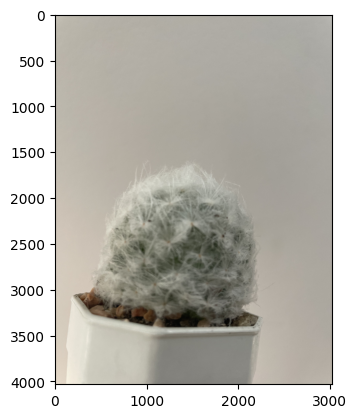

1/1 [==============================] - 0s 117ms/step
[[2.3058339e-04 9.9931550e-01 4.3700300e-05 4.1016712e-04]]
real: IMG_5016.jpg
predict: Mammillaria


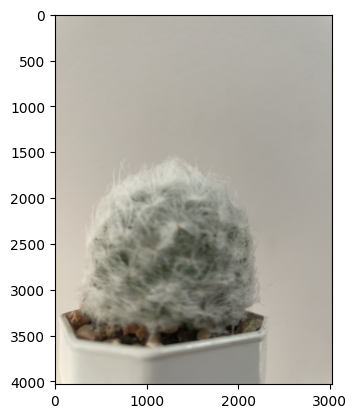

1/1 [==============================] - 0s 215ms/step
[[2.3633479e-04 9.9927598e-01 4.6297857e-05 4.4135217e-04]]
real: IMG_5017.jpg
predict: Mammillaria


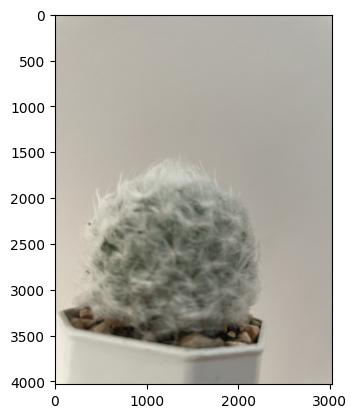

1/1 [==============================] - 0s 116ms/step
[[3.1986306e-04 9.9928433e-01 3.4260949e-05 3.6151576e-04]]
real: IMG_5018.jpg
predict: Mammillaria


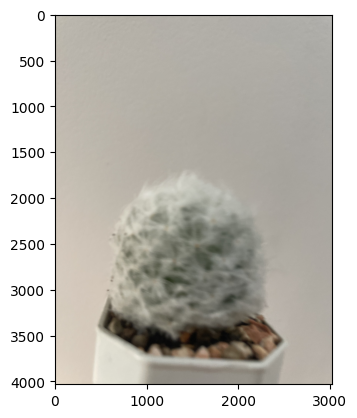

1/1 [==============================] - 0s 116ms/step
[[5.9978530e-04 9.9890709e-01 5.4341024e-05 4.3882089e-04]]
real: IMG_5019.jpg
predict: Mammillaria


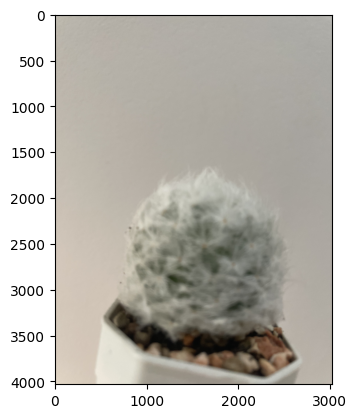

1/1 [==============================] - 0s 141ms/step
[[2.2211581e-04 9.9758339e-01 1.5251464e-04 2.0419459e-03]]
real: IMG_5022.jpg
predict: Mammillaria


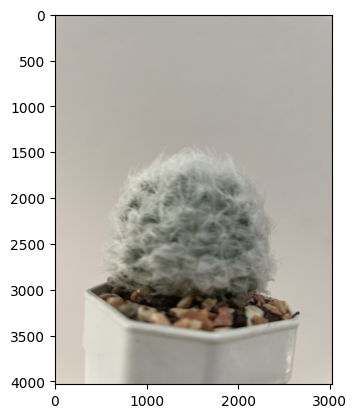

1/1 [==============================] - 0s 199ms/step
[[1.7208702e-04 9.9779069e-01 1.3207929e-04 1.9050987e-03]]
real: IMG_5023.jpg
predict: Mammillaria


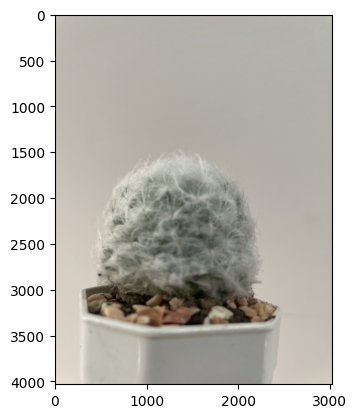

1/1 [==============================] - 0s 216ms/step
[[1.6461566e-04 9.9823040e-01 1.0719297e-04 1.4978905e-03]]
real: IMG_5024.jpg
predict: Mammillaria


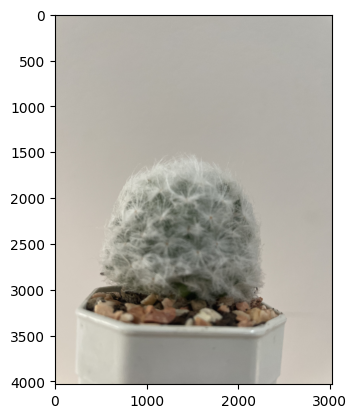

1/1 [==============================] - 0s 114ms/step
[[2.0464712e-04 9.9841833e-01 1.4196408e-04 1.2350796e-03]]
real: IMG_5025.jpg
predict: Mammillaria


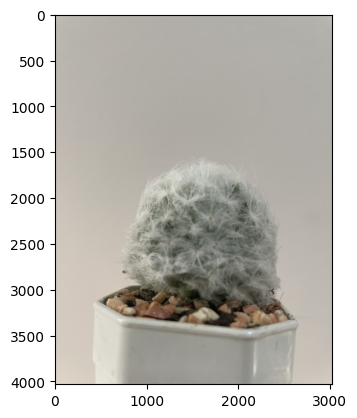

1/1 [==============================] - 0s 118ms/step
[[1.9572626e-04 9.9844390e-01 1.4414040e-04 1.2163257e-03]]
real: IMG_5026.jpg
predict: Mammillaria


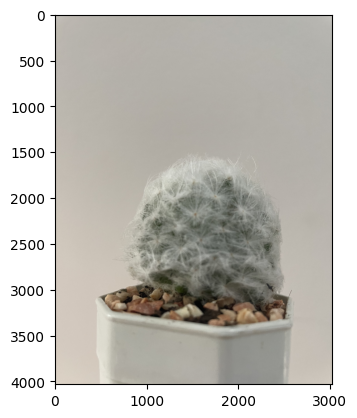

1/1 [==============================] - 0s 116ms/step
[[2.7277585e-04 9.9740499e-01 1.3685419e-04 2.1854171e-03]]
real: IMG_5027.jpg
predict: Mammillaria


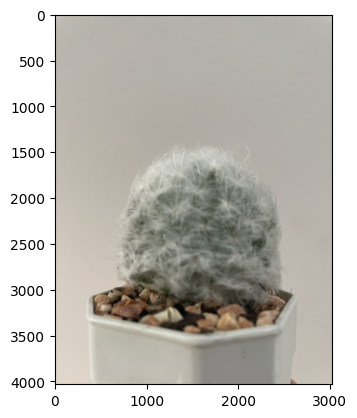

1/1 [==============================] - 0s 117ms/step
[[1.5939575e-03 1.0149474e-04 9.9320215e-01 5.1023960e-03]]
real: IMG_3060.jpg
predict: Melocactus


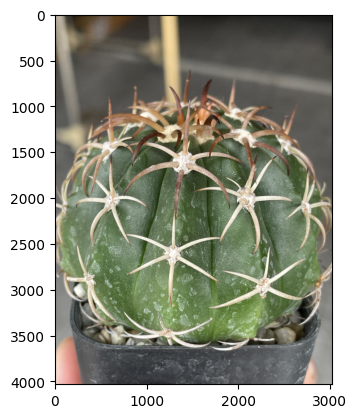

1/1 [==============================] - 0s 192ms/step
[[2.5196834e-03 7.6869677e-04 9.8603606e-01 1.0675520e-02]]
real: IMG_3061.jpg
predict: Melocactus


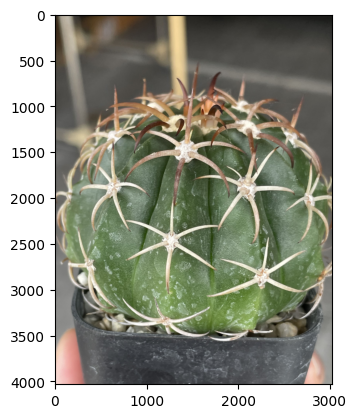

1/1 [==============================] - 0s 205ms/step
[[2.180039e-03 4.504264e-04 9.944571e-01 2.912357e-03]]
real: IMG_3062.jpg
predict: Melocactus


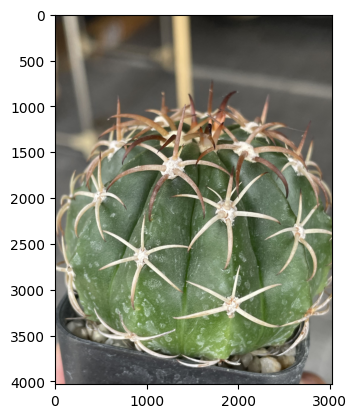

1/1 [==============================] - 0s 127ms/step
[[1.2129006e-03 5.6578591e-04 9.9465102e-01 3.5703399e-03]]
real: IMG_3063.jpg
predict: Melocactus


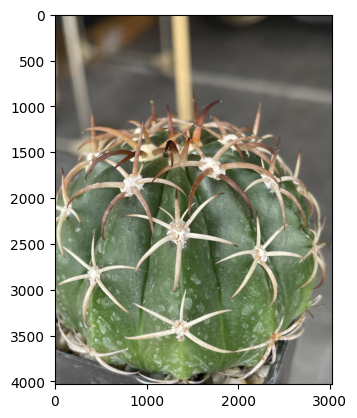

1/1 [==============================] - 0s 123ms/step
[[1.6113996e-03 9.4141159e-04 9.9376959e-01 3.6775402e-03]]
real: IMG_3064.jpg
predict: Melocactus


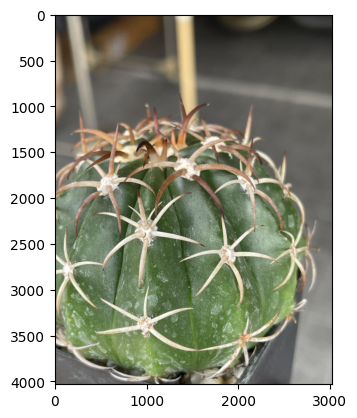

1/1 [==============================] - 0s 117ms/step
[[1.3129054e-04 1.8711701e-03 9.9679512e-01 1.2024388e-03]]
real: IMG_3066.jpg
predict: Melocactus


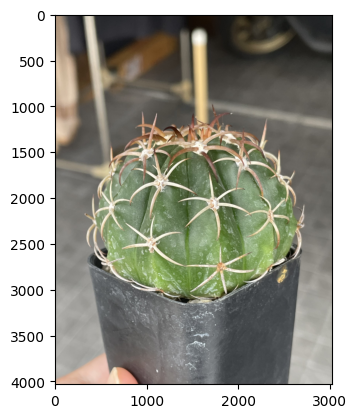

1/1 [==============================] - 0s 115ms/step
[[1.6112487e-04 3.2220660e-03 9.9465263e-01 1.9641360e-03]]
real: IMG_3067.jpg
predict: Melocactus


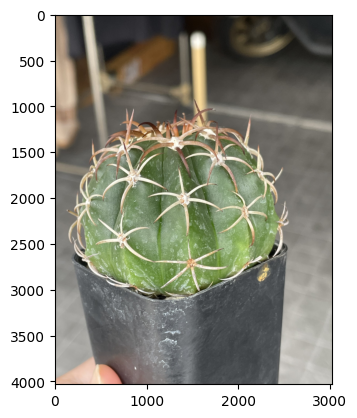

1/1 [==============================] - 0s 205ms/step
[[1.5262596e-04 2.0051890e-03 9.9531424e-01 2.5279510e-03]]
real: IMG_3068.jpg
predict: Melocactus


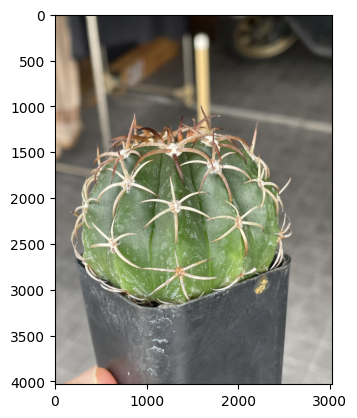

1/1 [==============================] - 0s 217ms/step
[[1.3360655e-04 1.2272469e-03 9.9639881e-01 2.2403519e-03]]
real: IMG_3069.jpg
predict: Melocactus


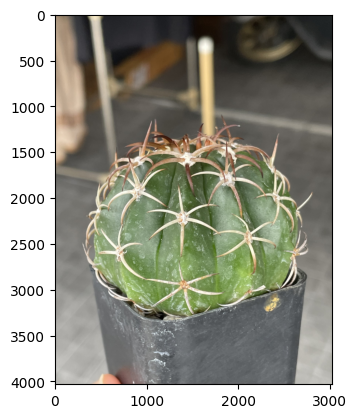

1/1 [==============================] - 0s 116ms/step
[[1.0714989e-04 1.8760655e-03 9.9613202e-01 1.8848215e-03]]
real: IMG_3070.jpg
predict: Melocactus


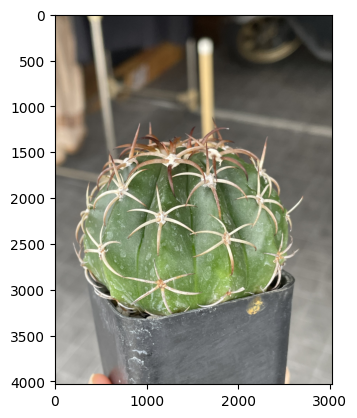

1/1 [==============================] - 0s 120ms/step
[[1.2026470e-04 8.7519176e-04 9.9748224e-01 1.5222970e-03]]
real: IMG_3071.jpg
predict: Melocactus


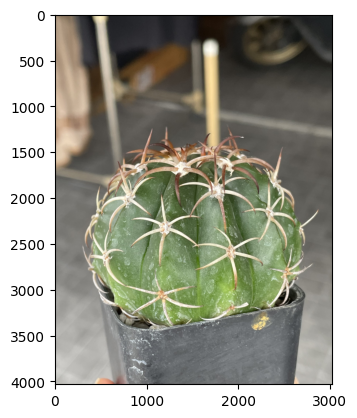

1/1 [==============================] - 0s 115ms/step
[[2.7080718e-04 1.0304938e-03 9.9673355e-01 1.9652150e-03]]
real: IMG_3072.jpg
predict: Melocactus


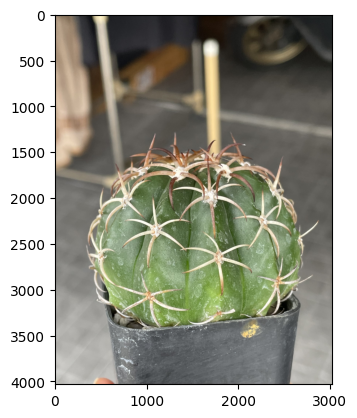

1/1 [==============================] - 0s 115ms/step
[[1.1003648e-03 8.9932629e-04 9.9587041e-01 2.1299492e-03]]
real: IMG_3073.jpg
predict: Melocactus


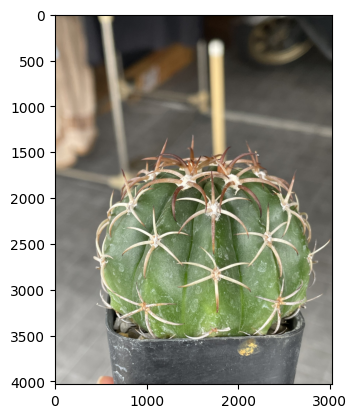

1/1 [==============================] - 0s 210ms/step
[[5.6921516e-04 6.8740716e-04 9.9694568e-01 1.7976461e-03]]
real: IMG_3074.jpg
predict: Melocactus


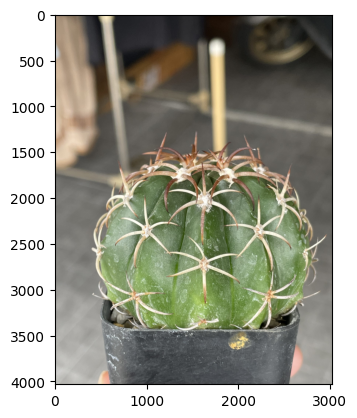

1/1 [==============================] - 0s 211ms/step
[[1.8301942e-04 9.4261381e-04 9.9773920e-01 1.1351387e-03]]
real: IMG_3075.jpg
predict: Melocactus


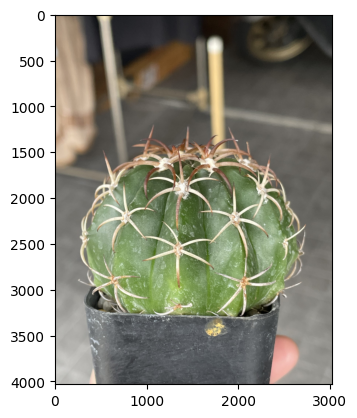

1/1 [==============================] - 0s 133ms/step
[[8.4236992e-05 4.7365532e-04 9.9882632e-01 6.1580486e-04]]
real: IMG_3076.jpg
predict: Melocactus


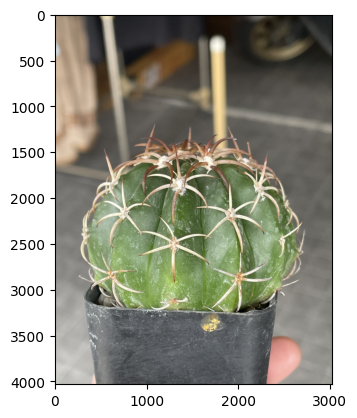

1/1 [==============================] - 0s 115ms/step
[[9.5713935e-05 9.0363953e-04 9.9842095e-01 5.7973189e-04]]
real: IMG_3077.jpg
predict: Melocactus


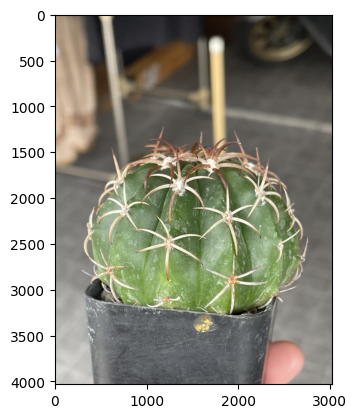

1/1 [==============================] - 0s 115ms/step
[[1.3546445e-04 1.0634699e-03 9.9815720e-01 6.4385572e-04]]
real: IMG_3078.jpg
predict: Melocactus


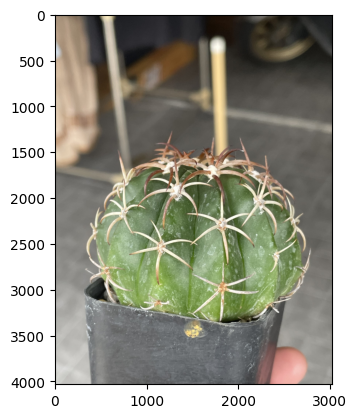

1/1 [==============================] - 0s 115ms/step
[[1.4918513e-04 2.4247686e-03 9.9659568e-01 8.3033636e-04]]
real: IMG_3079.jpg
predict: Melocactus


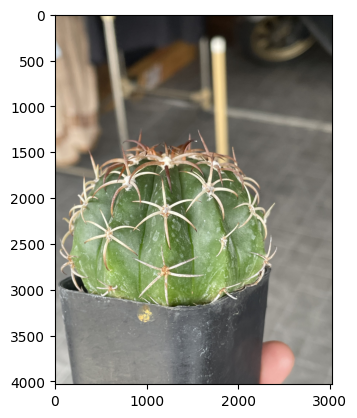

1/1 [==============================] - 0s 242ms/step
[[1.2471057e-04 1.0760714e-03 9.9781501e-01 9.8423625e-04]]
real: IMG_3080.jpg
predict: Melocactus


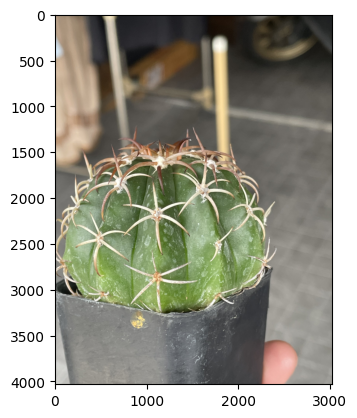

1/1 [==============================] - 0s 214ms/step
[[0.00995194 0.01711017 0.0463912  0.9265467 ]]
real: IMG_3645.jpg
predict: cactus


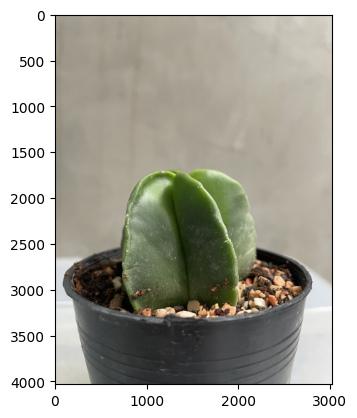

1/1 [==============================] - 0s 128ms/step
[[0.01418254 0.01844547 0.04975591 0.9176161 ]]
real: IMG_3646.jpg
predict: cactus


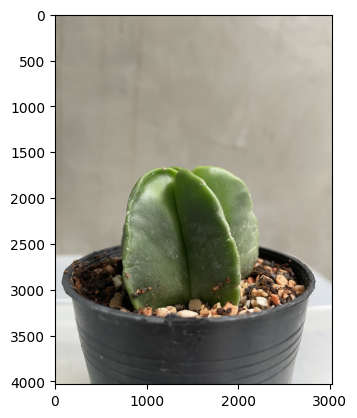

1/1 [==============================] - 0s 118ms/step
[[6.9801352e-04 1.0379603e-03 8.2679540e-01 1.7146869e-01]]
real: IMG_3647.jpg
predict: Melocactus


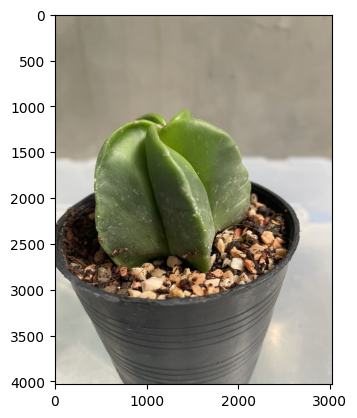

1/1 [==============================] - 0s 119ms/step
[[4.9964781e-04 1.0974623e-03 8.4409547e-01 1.5430745e-01]]
real: IMG_3648.jpg
predict: Melocactus


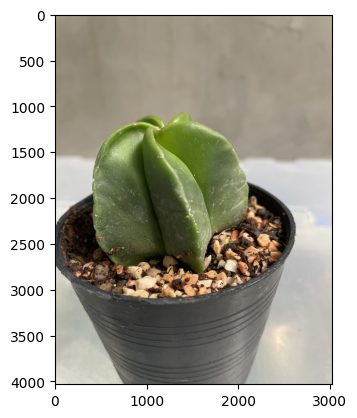

1/1 [==============================] - 0s 136ms/step
[[8.9442050e-01 5.1572808e-04 7.4393544e-03 9.7624473e-02]]
real: IMG_3649.jpg
predict: Astrophytum


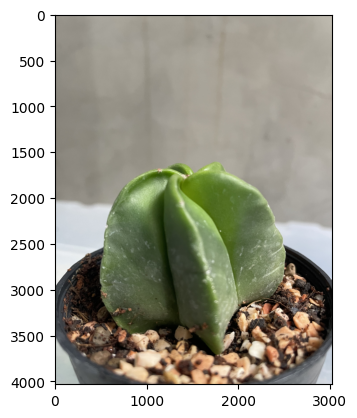

1/1 [==============================] - 0s 213ms/step
[[7.5405067e-01 3.1680707e-04 1.1115869e-02 2.3451665e-01]]
real: IMG_3650.jpg
predict: Astrophytum


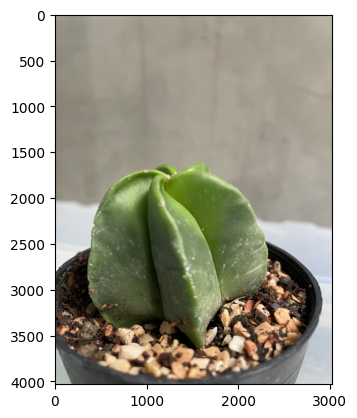

1/1 [==============================] - 0s 188ms/step
[[0.6600609  0.00193582 0.02106213 0.31694123]]
real: IMG_3651.jpg
predict: Astrophytum


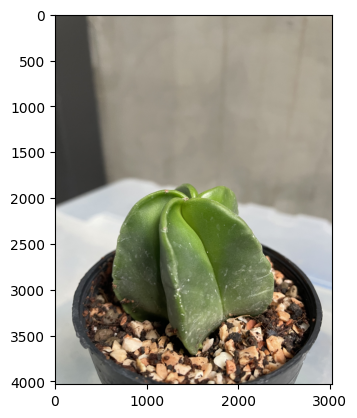

1/1 [==============================] - 0s 128ms/step
[[8.2453299e-01 4.1332818e-04 1.5114459e-02 1.5993924e-01]]
real: IMG_3652.jpg
predict: Astrophytum


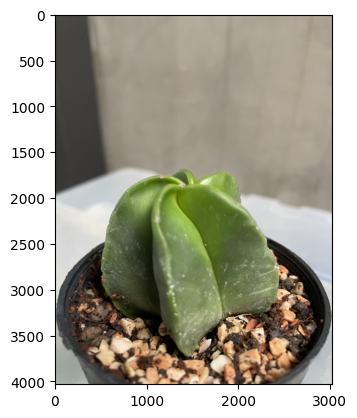

1/1 [==============================] - 0s 119ms/step
[[0.8106932  0.00446009 0.0330993  0.1517474 ]]
real: IMG_3653.jpg
predict: Astrophytum


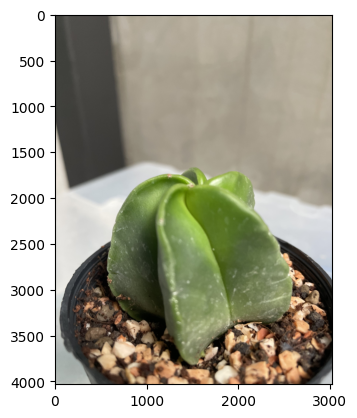

1/1 [==============================] - 0s 117ms/step
[[0.7599087  0.0011246  0.02895408 0.21001273]]
real: IMG_3654.jpg
predict: Astrophytum


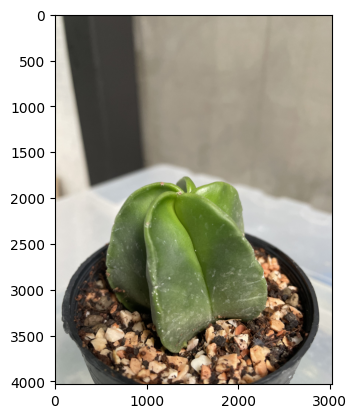

1/1 [==============================] - 0s 127ms/step
[[0.00344424 0.00075126 0.35338944 0.64241505]]
real: IMG_3655.jpg
predict: cactus


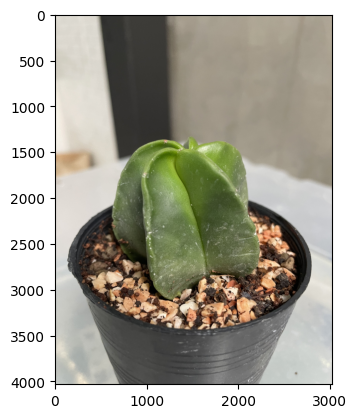

1/1 [==============================] - 0s 229ms/step
[[0.00109902 0.01068822 0.83818924 0.15002349]]
real: IMG_3656.jpg
predict: Melocactus


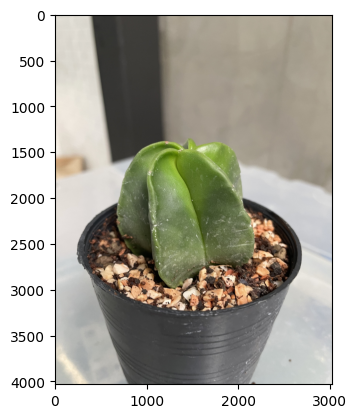

1/1 [==============================] - 0s 231ms/step
[[1.7862557e-02 6.5092376e-04 1.0673029e-01 8.7475628e-01]]
real: IMG_3657.jpg
predict: cactus


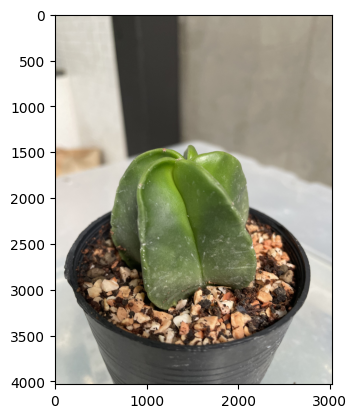

1/1 [==============================] - 0s 136ms/step
[[0.25603133 0.00312751 0.06236146 0.6784797 ]]
real: IMG_3658.jpg
predict: cactus


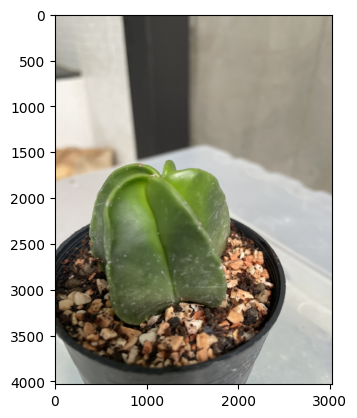

1/1 [==============================] - 0s 133ms/step
[[0.12987864 0.00395657 0.09122726 0.7749375 ]]
real: IMG_3659.jpg
predict: cactus


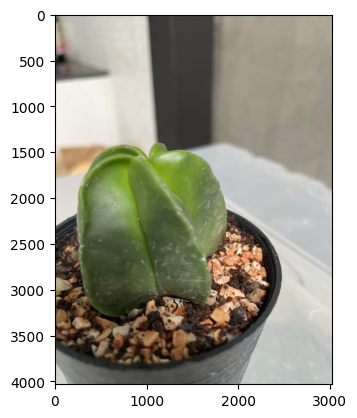

1/1 [==============================] - 0s 122ms/step
[[0.04725689 0.00130578 0.03910299 0.9123344 ]]
real: IMG_3660.jpg
predict: cactus


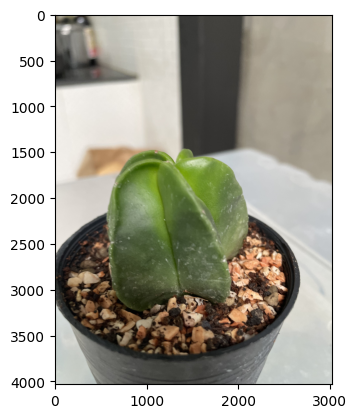

1/1 [==============================] - 0s 120ms/step
[[0.17667736 0.02567388 0.06574533 0.7319034 ]]
real: IMG_3661.jpg
predict: cactus


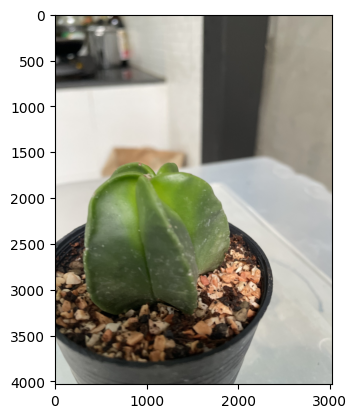

1/1 [==============================] - 0s 227ms/step
[[0.29206365 0.01415184 0.08957592 0.6042085 ]]
real: IMG_3662.jpg
predict: cactus


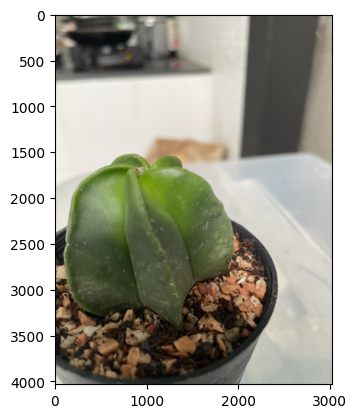

1/1 [==============================] - 0s 204ms/step
[[0.21115844 0.00989129 0.10164347 0.67730683]]
real: IMG_3663.jpg
predict: cactus


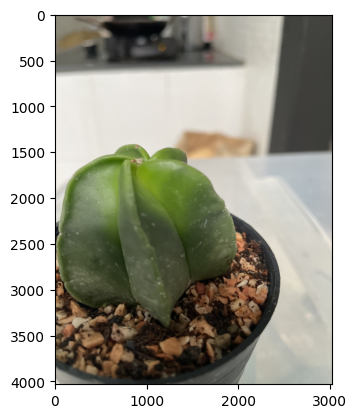

1/1 [==============================] - 0s 129ms/step
[[0.16445585 0.01123596 0.0035441  0.8207641 ]]
real: IMG_3664.jpg
predict: cactus


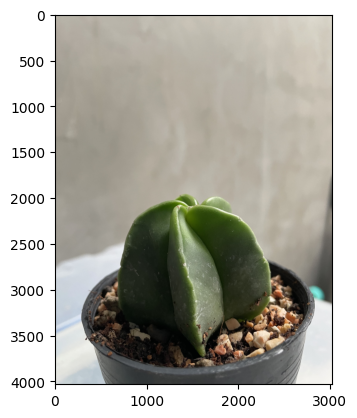

In [ ]:
testpath = 'drive/MyDrive/test/'
testImg = [testpath+f for f in listdir(testpath) if os.path.isdir(join(testpath, f))]

rimg = []
label = ['Astrophytum','Mammillaria','Melocactus','cactus']

for imagePath in testImg:
    for item in os.listdir(imagePath):
        if item.endswith('.jpg'):
            file = os.path.join(imagePath, item)
            img = cv2.imread(file)
            ori = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (width, width))
            rimg = np.array(img)
            rimg = rimg.astype('float32')
            rimg /= 255
            rimg = np.reshape(rimg, (1, 256, 256, 3))
            predict = model.predict(rimg)
            result = label[np.argmax(predict)]
            print(predict)
            print('real: ' + str(item))
            print('predict: ' + str(result))
            plt.imshow(ori)
            plt.show()

In [ ]:
from tensorflow.keras.models import load_model


In [ ]:
model.save("modelMLtest.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from google.colab import files
files.download("modelMLtest.h5")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>